<a href="https://colab.research.google.com/github/Ryan-Shaik/Computer_Vision/blob/index.edit/OpenCV_Face_Eye_and_motion%20Datection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Face and Eye Detection with Haar Cascade Classifiers

1. Use a Haarcascade classifier to detect faces
2. Use a Haarcascade Classifier to detect eyes
3. Use a Haarcascade Classifier to detect faces and eyes from webcam in Colab

In [ ]:
import numpy
import cv2 as cv
import matplotlib.pyplot as plt


In [ ]:
def imshow(title = "Image", image = None, size = 10):
    w,h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

In [ ]:
!unzip /content/drive/MyDrive/Haarcascade.zip

Archive:  /content/drive/MyDrive/Haarcascade.zip
   creating: Haarcascade/
  inflating: Haarcascade/haarcascade_eye.xml  
  inflating: Haarcascade/haarcascade_frontalface_default.xml  
  inflating: Haarcascade/haarcascade_fullbody.xml  


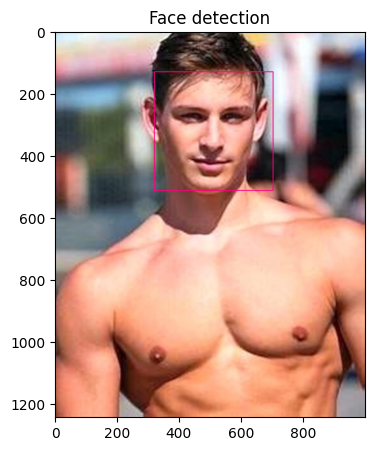

In [ ]:
# We point openCv's Cascade Classifier function to where our
# classifier (XML file format) is stored
face_classifier = cv.CascadeClassifier("/content/Haarcascade/haarcascade_frontalface_default.xml")

# load image then convert to grayscale
image = cv.imread("reno.jpg")
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Our classifier return the ROI of the detected face as tuple
# It stores the top left and bottom right coordinates
faces = face_classifier.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

# When no faces detected, face_classifier returns an empty tuple
if faces is None :
    print("No faces found")

# we iterate through our faves array and draw a rectangle
# over each face
for (x,y,w,h) in faces:
    cv.rectangle(image, (x,y), (x+w, y+h), (127,0,255), 2)

imshow("Face detection", image,5)

## Simple Eye & Face Detection

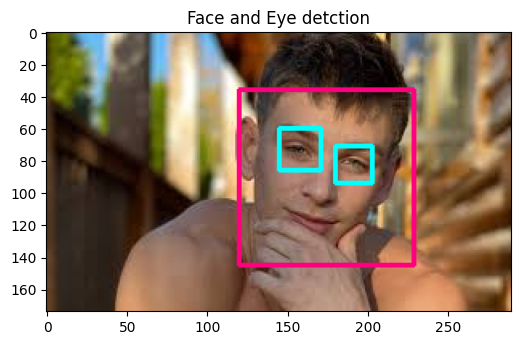

In [ ]:
face_classifier = cv.CascadeClassifier("/content/Haarcascade/haarcascade_frontalface_default.xml")
eye_classifier = cv.CascadeClassifier("/content/Haarcascade/haarcascade_eye.xml")

img = cv.imread("gold.jfif")
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

faces = face_classifier.detectMultiScale(gray, 1.3,5)

if faces is None:
    print("No face is detected")

for (x,y,w,h) in faces:
    cv.rectangle(img, (x,y), (x+w, y+h), (127,0,255), 2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]
    eyes = eye_classifier.detectMultiScale(roi_gray, )
    for (ex, ey, ew, eh) in eyes:
        cv.rectangle(roi_color, (ex,ey), (ex+ew, ey+eh), (255,255,0),2)

imshow("Face and Eye detction", img)

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename="photo.jpg", quality = 0.8):
    js = Javascript (
        async function takePhoto(quality){
            const div = document.createElement("div");
            const capture = document.createElement("button");
            capture.textContent = "Capture";
            div.appendChild(capture);
            const video = document.createElement("video");
            video.style.display = "block";

            const stream = await navigator.mediaDevices.getUserMedia({video: true});
            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);
            await new Promise((resolve) => capture.onclick = resolve);

            const canvas = document.createElement("canvas");
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext("2d").drawImage(video, 0, 0);
            stream.getVideoTracks()[0].stop();
            div.remove();
            return canvas.toDataURL("image/jpeg", quality);
        }
    )


    display(js)
    data = eval_js("takePhoto({})".format(quality))
    binary = b64decode(data.split(",")[1])
    with open(filename, "wb") as f:
        f.write(binary)
    return filename

In [ ]:
from IPython.display import Image
try:
    filename = take_photo()
    print("Saved to {}".format(filename))
    display(Image(filename))
except Exception as err:
    print(str(err))

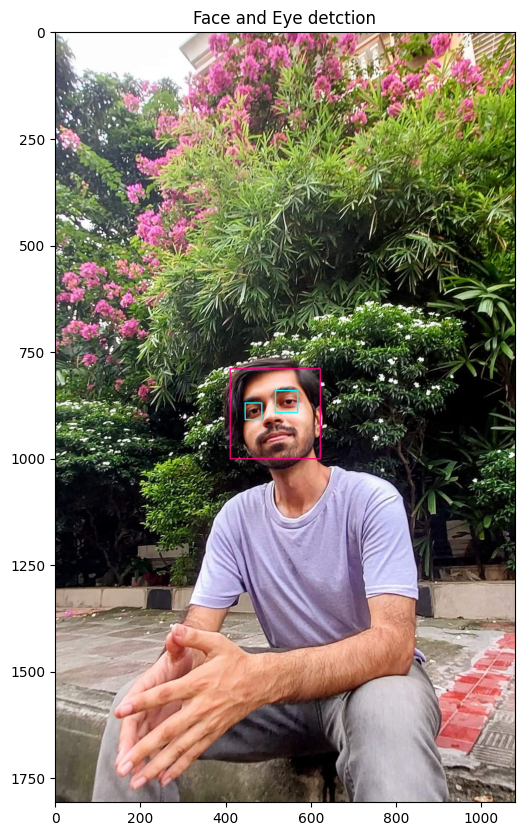

In [ ]:
face_classifier = cv.CascadeClassifier("/content/Haarcascade/haarcascade_frontalface_default.xml")
eye_classifier = cv.CascadeClassifier("/content/Haarcascade/haarcascade_eye.xml")

img = cv.imread("ryan.jpg")
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
faces = face_classifier.detectMultiScale(gray, 1.3,5)

if faces is None:
    print("No face is detected")

for (x,y,w,h) in faces:
    cv.rectangle(img, (x,y), (x+w, y+h), (127,0,255), 2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]
    eyes = eye_classifier.detectMultiScale(roi_gray, )
    for (ex, ey, ew, eh) in eyes:
        cv.rectangle(roi_color, (ex,ey), (ex+ew, ey+eh), (255,255,0),2)

imshow("Face and Eye detction", img)

## Vehicle and Pedestrian Detection

**Testing on single Frame from our video**

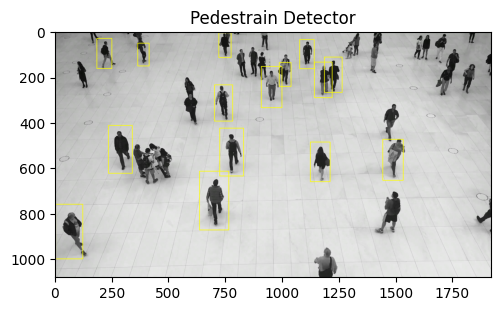

In [ ]:
 # Create video capturing object
cap = cv.VideoCapture("/content/moving.mp4")

# Load body classifier
body_classifier = cv.CascadeClassifier("/content/Haarcascade/haarcascade_fullbody.xml")

# Read first frame
ret, frame = cap.read()

# Ret is true if successfully read
if ret:

    # Grayscale our image for faster processing
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

    # pass frame to body classifier
    bodies = body_classifier.detectMultiScale(gray, 1.2,3)

    # Extract bounding boxes for any bodies identified
    for (x,y,w,h) in bodies:
        cv.rectangle(frame, (x,y), (x+w, y+h), (0,255,255),2)

# Release video
cap.release()
imshow("Pedestrain Detector", frame)

**Testing on 15 second clip**

We use cv2.VideoWriter to save the output as an AVI file.

`cv2.VideoWriter(Video_output.avi, cv2.VideoWriter_fiurcc('M', 'J','P', 'G'), FPS, (width, height))`


In [ ]:
cap = cv.VideoCapture("/content/moving.mp4")

# Get the width and height of the frame (integer)
w = int(cap.get(3))
h = int(cap.get(4))

# Define the code and create VideoWriter object. The output is stored in 'moving_output.avi' file
out = cv.VideoWriter("moving_out.avi", cv.VideoWriter_fourcc("M", "J", "P", "G"), 30, (w,h))


body_detector = cv.CascadeClassifier("/content/Haarcascade/haarcascade_fullbody.xml")

# Loop once video is successfully loaded
while(True):

    ret,frame = cap.read()
    if ret:
        gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

        # pass frame to our body classifier
        bodies = body_detector.detectMultiScale(gray, 1.2,3)

        # Extract bounding boxes for any bodies idenified
        for (x,y,w,h) in bodies:
            cv.rectangle(frame, (x,y), (x+w, y+h), (0,255,255),2)
        out.write(frame)
    else:
        break

cap.release()
out.release()

## Play Video within Colab

Steps:
1. Convert the AVI file to MP4 using FFMPEG
2. Load the HTML plugins in Python
3. Display HTML video player

In [ ]:
!ffmpeg -i /content/moving_out.avi moving_out.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import HTML
from base64 import b64encode


mp4 = open("moving_out.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width = 800 height = 500 controls>
    <source src="%s" type = "video/mp4">
</video>

""" % data_url)